<center><h1>Maharajwala_Raj_HW6</h1></center>
<br>
<br>

Name: Raj Vijay Maharajwala
<br>
Github Username: RajMaharajwala
<br>
USC ID: 4863-3649-66

Import packages

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import cufflinks as cf
import warnings
import pydotplus
from IPython.display import Image
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import _tree
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score,classification_report
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import statsmodels.api as sm
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
import dill
from imblearn.over_sampling import SMOTE
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

# Q1-a
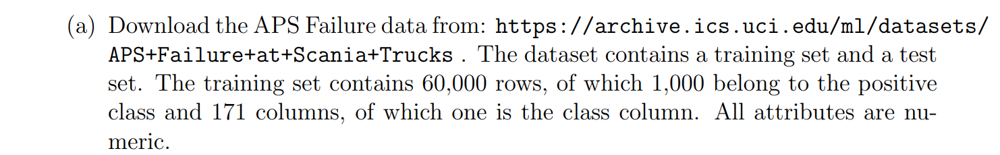

In [3]:
df_train = pd.read_csv("../data/aps_failure_training_set.csv", skiprows=20)
df_train

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


In [4]:
df_test = pd.read_csv("../data/aps_failure_test_set.csv", skiprows=20)
df_test

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0,20,12,0,0,0,0,0,...,1098,138,412,654,78,88,0,0,0,0
1,neg,82,0,68,40,0,0,0,0,0,...,1068,276,1620,116,86,462,0,0,0,0
2,neg,66002,2,212,112,0,0,0,0,0,...,495076,380368,440134,269556,1315022,153680,516,0,0,0
3,neg,59816,na,1010,936,0,0,0,0,0,...,540820,243270,483302,485332,431376,210074,281662,3232,0,0
4,neg,1814,na,156,140,0,0,0,0,0,...,7646,4144,18466,49782,3176,482,76,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,na,2130706432,892,0,0,0,0,0,...,632658,273242,510354,373918,349840,317840,960024,25566,0,0
15996,neg,18,0,52,46,8,26,0,0,0,...,266,44,46,14,2,0,0,0,0,0
15997,neg,79636,na,1670,1518,0,0,0,0,0,...,806832,449962,778826,581558,375498,222866,358934,19548,0,0
15998,neg,110,na,36,32,0,0,0,0,0,...,588,210,180,544,1004,1338,74,0,0,0


In [5]:
df_train.dtypes

class     object
aa_000     int64
ab_000    object
ac_000    object
ad_000    object
           ...  
ee_007    object
ee_008    object
ee_009    object
ef_000    object
eg_000    object
Length: 171, dtype: object

In [6]:
print(df_train.dtypes.unique())
print(df_train['class'].unique())

[dtype('O') dtype('int64')]
['neg' 'pos']


In [7]:
#Checking non numeric data
non_numeric_data = []
for clmn in df_train.columns:
    if df_train[clmn].dtypes == 'int64':
        continue
    uniq_list = df_train[clmn].unique()
    for ele in uniq_list:
        try:
            float(ele)
            continue
        except:
            non_numeric_data.append(ele)
print(set(non_numeric_data))

{'pos', 'na', 'neg'}


In [8]:
#replace na with np.nan so that we can convert dtype to int or flot later if needed
df_train.replace('na', np.nan, inplace=True)
df_test.replace('na', np.nan, inplace=True)

Replacing pos to 1, neg to 0 might be helpful later on

In [9]:
df_train.replace({'pos':1, 'neg':0}, inplace=True)
df_test.replace({'pos':1, 'neg':0}, inplace=True)

In [10]:
df_train['class'].unique()

array([0, 1], dtype=int64)

# Q1-b (i)
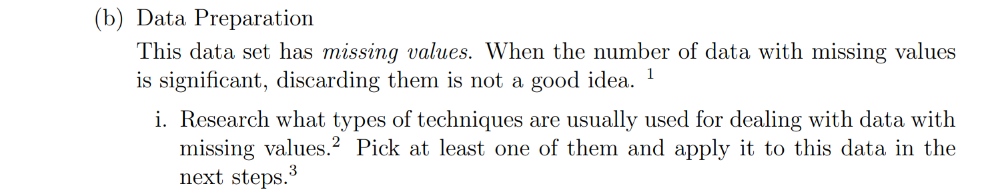

In [11]:
sorted(df_train.isna().sum().to_dict().items(), key = lambda x: x[1], reverse=True)

[('br_000', 49264),
 ('bq_000', 48722),
 ('bp_000', 47740),
 ('bo_000', 46333),
 ('ab_000', 46329),
 ('cr_000', 46329),
 ('bn_000', 44009),
 ('bm_000', 39549),
 ('bl_000', 27277),
 ('bk_000', 23034),
 ('ad_000', 14861),
 ('cf_000', 14861),
 ('cg_000', 14861),
 ('ch_000', 14861),
 ('co_000', 14861),
 ('ct_000', 13808),
 ('cu_000', 13808),
 ('cv_000', 13808),
 ('cx_000', 13808),
 ('cy_000', 13808),
 ('cz_000', 13808),
 ('da_000', 13808),
 ('db_000', 13808),
 ('dc_000', 13808),
 ('ec_00', 10239),
 ('cm_000', 9877),
 ('cl_000', 9553),
 ('ed_000', 9553),
 ('ak_000', 4400),
 ('ca_000', 4356),
 ('dm_000', 4009),
 ('df_000', 4008),
 ('dg_000', 4008),
 ('dh_000', 4008),
 ('dl_000', 4008),
 ('dj_000', 4007),
 ('dk_000', 4007),
 ('eb_000', 4007),
 ('di_000', 4006),
 ('ac_000', 3335),
 ('bx_000', 3257),
 ('cc_000', 3255),
 ('bd_000', 2727),
 ('ds_000', 2727),
 ('dt_000', 2727),
 ('dp_000', 2726),
 ('dq_000', 2726),
 ('dr_000', 2726),
 ('du_000', 2726),
 ('dv_000', 2726),
 ('bc_000', 2725),
 ('cp_0

In [12]:
#total missing in df_train, df_test
print(df_train.isna().sum().sum())
print(df_test.isna().sum().sum())

850015
228680


My objective is to fill the missing values in a DataFrame with the mean value of the data in the corresponding row based on the class it belongs to.

I am adding a reference link for different types of methods used to handle missing values below.

**References:**
```
https://www.analyticsvidhya.com/blog/2021/10/a-complete-guide-to-dealing-with-missing-values-in-python/
```

In [13]:
def fill_by_mean_by_class(df):
    dfneg = df[df['class']==0].astype(float)
    dfpos = df[df['class']==1].astype(float)
    dfneg = dfneg.fillna(dfneg.mean())
    dfpos = dfpos.fillna(dfpos.mean())
    df = pd.concat([dfneg,dfpos])
    return df.sample(frac=1).reset_index(drop=True) #Handled Missing Value and also suffle the dataset

dftrain_cleaned = fill_by_mean_by_class(df_train)
dftest_cleaned = fill_by_mean_by_class(df_test)

In [14]:
# # Other Way by MICE: all the missing Value is numeric, I am using Mice with bounds for handling those missing values
# def fill_missing_data(df):
#     imputer=IterativeImputer(min_value=0, max_value=1, imputation_order='ascending',max_iter=10,random_state=42,n_nearest_features=5)
#     imputed_dataset = imputer.fit_transform(df)
#     df_cleaned = pd.DataFrame(imputed_dataset, columns = df.columns)
#     return df_cleaned
# dftrain_cleaned = fill_missing_data(df_train)
# dftest_cleaned = fill_missing_data(df_test)

In [15]:
print(dftrain_cleaned.isna().any().any())
print(dftest_cleaned.isna().any().any())

False
False


# Q1-b (ii)
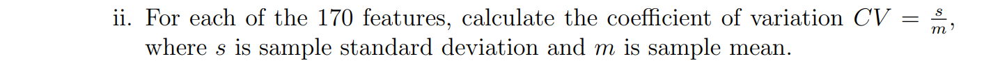

In [16]:
CV_train_set = (dftrain_cleaned.iloc[:,1:].std() / dftrain_cleaned.iloc[:,1:].mean()).to_dict()
print("Maximum CV in training set:", max(CV_train_set.items(), key=lambda x: x[1]))
CV_train_set

Maximum CV in training set: ('cs_009', 235.24916933266726)


{'aa_000': 2.450937577944003,
 'ab_000': 2.332622591575291,
 'ac_000': 2.1841664860995404,
 'ad_000': 185.47361364116887,
 'ae_000': 22.955423203324656,
 'af_000': 18.27743450327893,
 'ag_000': 91.9776476219469,
 'ag_001': 35.079443087619715,
 'ag_002': 17.47127167798798,
 'ag_003': 8.58355648972053,
 'ag_004': 5.413344600874541,
 'ag_005': 2.9319661758083697,
 'ag_006': 2.3475136147862106,
 'ag_007': 2.8356728825257567,
 'ag_008': 6.158809081647842,
 'ag_009': 33.059322806599084,
 'ah_000': 2.3022188962768695,
 'ai_000': 17.853530074039647,
 'aj_000': 43.60437774554391,
 'ak_000': 66.09657697312132,
 'al_000': 8.97024373815892,
 'am_0': 8.956349603235394,
 'an_000': 2.2409792660596737,
 'ao_000': 2.2619147244604645,
 'ap_000': 3.056211207770544,
 'aq_000': 2.8387012648696266,
 'ar_000': 9.820832518896912,
 'as_000': 85.04764456604107,
 'at_000': 23.149229369184756,
 'au_000': 66.38836447988554,
 'av_000': 5.562847283367661,
 'ax_000': 3.79301794110332,
 'ay_000': 37.18836034238284,
 '

In [17]:
CV_test_set = (dftest_cleaned.iloc[:,1:].std() / dftest_cleaned.iloc[:,1:].mean()).to_dict()
print("Maximum CV in test set:", max(CV_test_set.items(), key=lambda x: x[1]))
CV_test_set

Maximum CV in test set: ('cs_009', 124.63856833862958)


{'aa_000': 7.405254254700795,
 'ab_000': 1.618528065375922,
 'ac_000': 2.1837591384242527,
 'ad_000': 2.9288791934315714,
 'ae_000': 18.113092238301505,
 'af_000': 16.16185038472262,
 'ag_000': 53.361691352903335,
 'ag_001': 43.257626478684706,
 'ag_002': 17.103561157569047,
 'ag_003': 9.096538423677298,
 'ag_004': 5.679521834044526,
 'ag_005': 3.0878323670378234,
 'ag_006': 2.3830414984931307,
 'ag_007': 2.737595300815086,
 'ag_008': 6.70669649887857,
 'ag_009': 29.572792055233688,
 'ah_000': 2.3652570729623132,
 'ai_000': 19.026840461863596,
 'aj_000': 40.703201536529455,
 'ak_000': 88.83559895637467,
 'al_000': 9.04447121285306,
 'am_0': 8.920493587762602,
 'an_000': 2.3048905206702246,
 'ao_000': 2.3279385482703465,
 'ap_000': 3.164685893811098,
 'aq_000': 2.8925131309754075,
 'ar_000': 8.070111807233017,
 'as_000': 81.81507586099475,
 'at_000': 22.105522141459296,
 'au_000': 83.15783544921074,
 'av_000': 5.290609304191685,
 'ax_000': 3.6855659254863617,
 'ay_000': 39.8628029160811

In general, higer the CV higher the variablity

# Q1-b (iii)
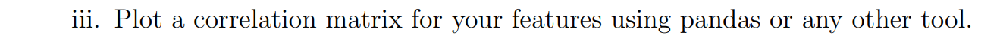

In [17]:
plt.figure(figsize=(100, 100))
sns.heatmap(dftrain_cleaned.iloc[:,1:].corr(), annot = True, cmap="coolwarm")
plt.title("Correlation Matrix on Cleaned Dataset")
plt.show()

# Q1-b (iv)
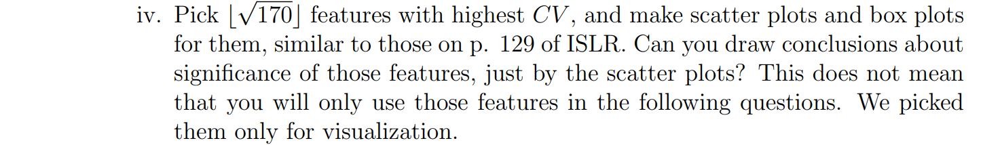

In [18]:
CVdict = sorted(CV_train_set.items(), key = lambda x:x[1], reverse=True)
Top_CV = dict(CVdict[:round(170**0.5)])
print(len(Top_CV))
Top_CV

13


{'cs_009': 235.24916933266726,
 'cf_000': 185.86973570391567,
 'co_000': 185.56004719920344,
 'ad_000': 185.47361364116887,
 'dj_000': 110.54190078007223,
 'ag_000': 91.9776476219469,
 'as_000': 85.04764456604107,
 'ay_009': 84.03037362245882,
 'dh_000': 78.44180665024481,
 'az_009': 76.98022143823638,
 'au_000': 66.38836447988554,
 'ak_000': 66.09657697312132,
 'ch_000': 52.793674314647824}

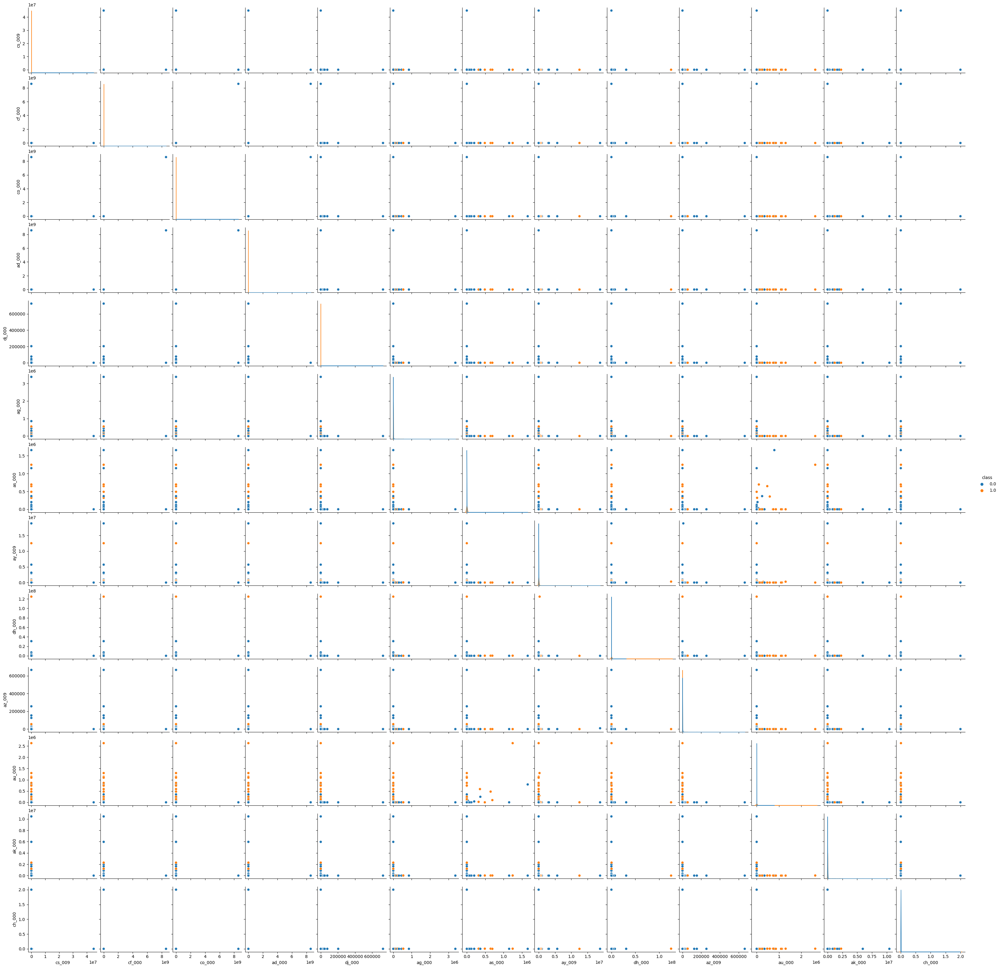

In [19]:
selected_features = list(Top_CV.keys())
selected_features.append('class')
sns.pairplot(dftrain_cleaned[selected_features], diag_kind='kde', hue = 'class')
plt.show()

[]

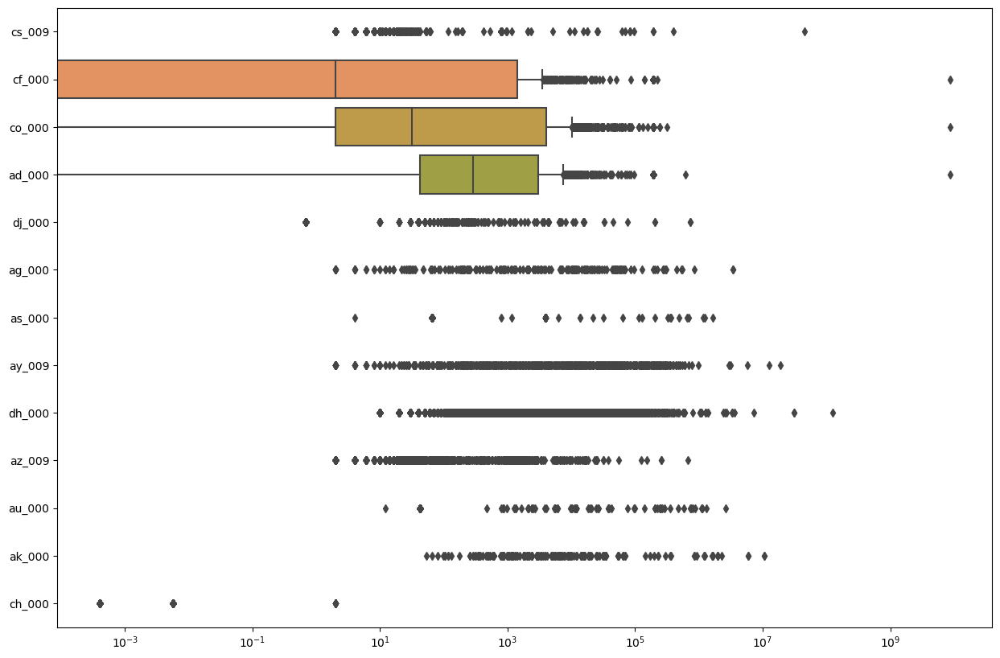

In [20]:
fig, axes = plt.subplots(figsize=(15, 10))
box = sns.boxplot(data=dftrain_cleaned[selected_features[:-1]], ax=axes, orient='h')
box.set(xscale="log")
plt.plot()

From scatter plots:
   1. Between some of the selected features there is clear separation between the two classes but not for all of them.
   2. Rest there is no significant observation for this data alone from scatter plot also we have imputed lot of missing data using MICE so no clear depiction here.

# Q1-b (v)
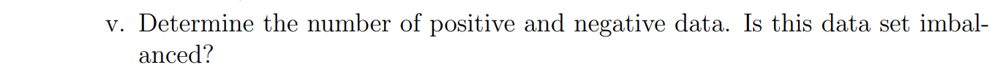

In [19]:
df_train['class'].replace({0: 'negative', 1: 'positive'}).value_counts()

negative    59000
positive     1000
Name: class, dtype: int64

In [20]:
df_test['class'].replace({0: 'negative', 1: 'positive'}).value_counts()

negative    15625
positive      375
Name: class, dtype: int64

Both test and train dataset are imbalanced (much more negative class, and extremly less positive class comparatively) 

# Q1-c 
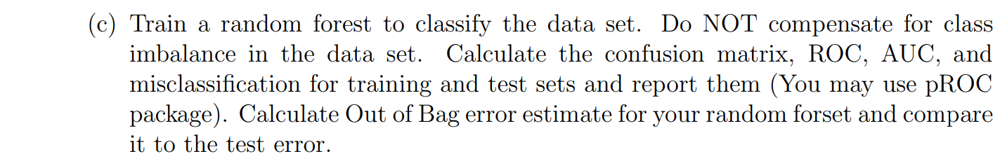

In [21]:
# split into training and test set
Xtrain, ytrain, Xtest, ytest = dftrain_cleaned.iloc[:,1:], dftrain_cleaned.iloc[:,:1], dftest_cleaned.iloc[:,1:], dftest_cleaned.iloc[:,:1]

In [22]:
# ROC curve
def ROC_with_AUC(FPR, TPR, auc, data_for):
    plt.rcParams["figure.figsize"] = [5,5]
    plt.plot(FPR, TPR, color='red', label='ROC curve with AUC: ' + str(auc))
    plt.plot([0, 1], [0, 1], color='black', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {data_for} data')
    plt.xlim([-0.1, 1.0])
    plt.ylim([-0.1, 1.1])
    plt.legend(loc='lower right')
    plt.show()

Train accuracy: 1.0
Test accuracy: 0.9986

Confusion matrix for Training set:
[[59000     0]
 [    0  1000]]

Confusion matrix for Test set:
[[15625     0]
 [   23   352]]

Training AUC score: 1.0
Test AUC score: 0.9998

Training misclassification: 0.0
Test misclassification: 0.0014

Out of Bag error estimate: 1


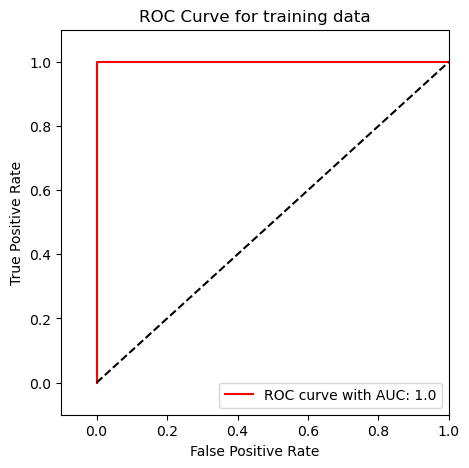

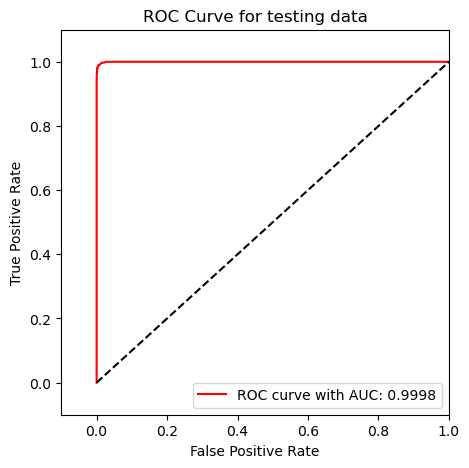

In [24]:
model = RandomForestClassifier(random_state=42)
model.fit(Xtrain,ytrain)

ypred_train = model.predict(Xtrain)
ypred_test = model.predict(Xtest)

train_accuracy = accuracy_score(ytrain, ypred_train)
test_accuracy = accuracy_score(ytest, ypred_test)
print(f"Train accuracy: {round(train_accuracy,4)}\nTest accuracy: {round(test_accuracy,4)}\n")

#Confusion matrix
CF_train = confusion_matrix(ytrain, ypred_train)
CF_test = confusion_matrix(ytest, ypred_test)
print(f"Confusion matrix for Training set:\n{CF_train}\n\nConfusion matrix for Test set:\n{CF_test}\n")

#ROC curve and AUC curve
FPR_train, TPR_train, thresholds_train = roc_curve(ytrain, model.predict_proba(Xtrain)[:,1])
FPR_test, TPR_test, thresholds_test = roc_curve(ytest, model.predict_proba(Xtest)[:,1])
train_auc = round(auc(FPR_train, TPR_train),4)
test_auc = round(auc(FPR_test, TPR_test),4)
print(f"Training AUC score: {train_auc}\nTest AUC score: {test_auc}\n")

# misclassification
train_error = 1 - model.score(Xtrain, ytrain)
test_error = 1 - model.score(Xtest, ytest)
print(f"Training misclassification: {round(train_error,4)}\nTest misclassification: {round(test_error,4)}\n")

# Calculate the Out of Bag error estimate for the random forest
oob_error = 1 - model.oob_score
print("Out of Bag error estimate:", oob_error)

ROC_with_AUC(FPR_train, TPR_train, train_auc, "training")
ROC_with_AUC(FPR_test, TPR_test, test_auc, "testing")

# Q1-d
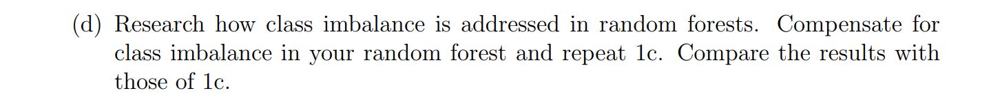

Train weighted accuracy: 1.0
Test weighted accuracy: 0.9975

Confusion matrix for weighted Training set:
[[59000     0]
 [    0  1000]]

Confusion matrix for weighted Test set:
[[15624     1]
 [   39   336]]

Training AUC score: 1.0
Test AUC score: 0.9999

Training misclassification: 0.0
Test misclassification: 0.0025

Out of Bag error estimate: 1


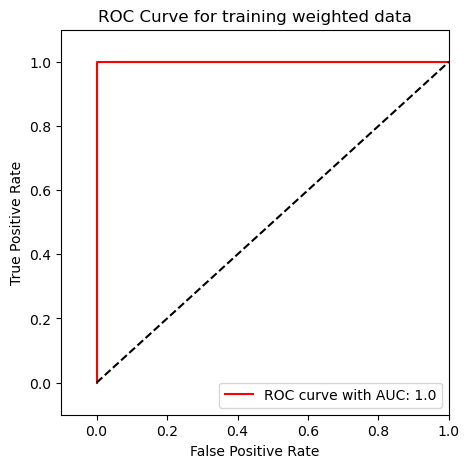

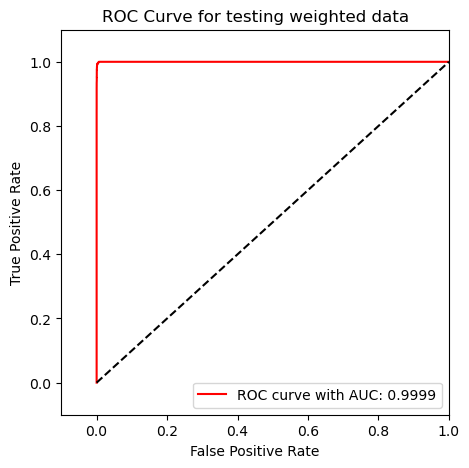

In [25]:
model = RandomForestClassifier(random_state=42, class_weight = "balanced") 
model.fit(Xtrain,ytrain)

ypred_train = model.predict(Xtrain)
ypred_test = model.predict(Xtest)

train_accuracy = accuracy_score(ytrain, ypred_train)
test_accuracy = accuracy_score(ytest, ypred_test)
print(f"Train weighted accuracy: {round(train_accuracy,4)}\nTest weighted accuracy: {round(test_accuracy,4)}\n")

#Confusion matrix
CF_train = confusion_matrix(ytrain, ypred_train)
CF_test = confusion_matrix(ytest, ypred_test)
print(f"Confusion matrix for weighted Training set:\n{CF_train}\n\nConfusion matrix for weighted Test set:\n{CF_test}\n")

#ROC curve and AUC curve
FPR_train, TPR_train, thresholds_train = roc_curve(ytrain, model.predict_proba(Xtrain)[:,1])
FPR_test, TPR_test, thresholds_test = roc_curve(ytest, model.predict_proba(Xtest)[:,1])
train_auc = round(auc(FPR_train, TPR_train),4)
test_auc = round(auc(FPR_test, TPR_test),4)
print(f"Training AUC score: {train_auc}\nTest AUC score: {test_auc}\n")

# misclassification
train_error = 1 - model.score(Xtrain, ytrain)
test_error = 1 - model.score(Xtest, ytest)
print(f"Training misclassification: {round(train_error,4)}\nTest misclassification: {round(test_error,4)}\n")

# Calculate the Out of Bag error estimate for the random forest
oob_error = 1 - model.oob_score
print("Out of Bag error estimate:", oob_error)

ROC_with_AUC(FPR_train, TPR_train, train_auc, "training weighted")
ROC_with_AUC(FPR_test, TPR_test, test_auc, "testing weighted")

Insights:

In 1c, we trained a random forest classifier without compensating for class imbalance in the dataset. In the comparison in 1d, we have use the same training and test sets as in 1c to train a new random forest classifier with class weights to address the class imbalance.

1. Test Accuracy of 1d is somewhat less than 1c
2. Test misclassification of 1d (0.0025) is more than Test misclassification of 1c (0.0014).

class_weight="balanced" did not improve performance and actually led to a decrease in test accuracy compared to the unweighted random forest.

One possible reason for this could be that your dataset has a severe class imbalance, and even with class weight adjustment, the minority class is still not well-represented in the training set.

It's important to experiment with different techniques and evaluate their impact on performance to find the best approach.

# Q1-e
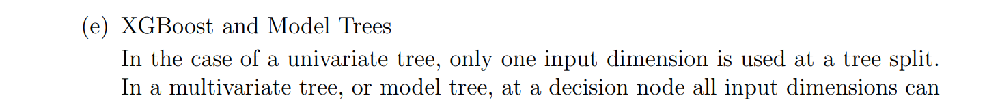
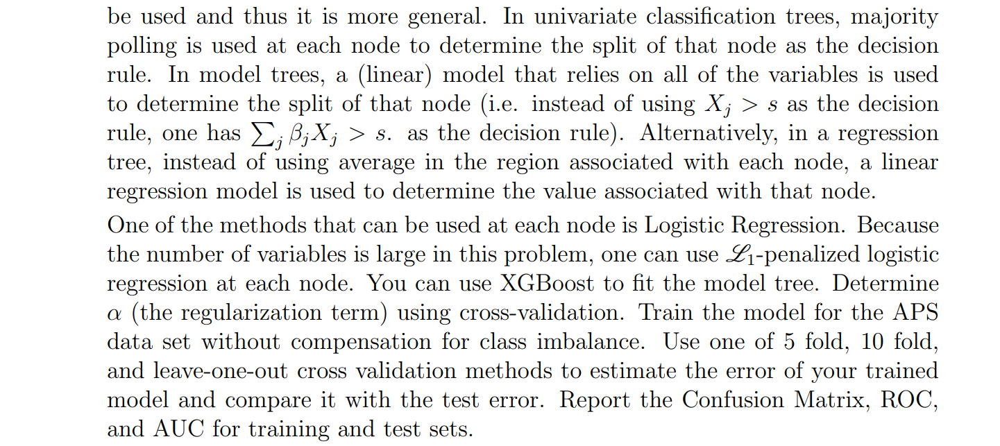

In [24]:
ss = StandardScaler()
Xtrain_t = pd.DataFrame(ss.fit_transform(Xtrain), columns=Xtrain.columns)
Xtest_t = pd.DataFrame(ss.transform(Xtest), columns=Xtest.columns)  # use transform() instead of fit_transform()
estimator = XGBClassifier(objective='binary:logistic', learning_rate=0.1, max_depth=5, use_label_encoder=False, colsample_bytree=0.3)
param_grid = {"reg_alpha": [0.01, 0.05, 0.07, 0.08, 0.09, 0.1, 0.2, 0.5, 0.75, 1, 2, 3, 4, 5, 10, 20, 50, 100, 200]}
cv = KFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(estimator, param_grid, n_jobs=-1, cv=cv, scoring="accuracy")
grid_search.fit(Xtrain_t, ytrain)  # use ytrain instead of Xtest_t

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.3,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     inte...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=5,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'reg_alpha': [0.01, 0.05, 0.07, 0.08, 0.09, 0.1, 0.2,
                                       0.5, 0.75, 1, 2, 3, 4, 5, 10, 20, 50,
                                       100, 200]},
             scoring='accuracy')

In [25]:
print(f"The best alpha is {grid_search.best_params_['reg_alpha']} with a cross-validation accuracy of {round(grid_search.best_score_, 4)}")

The best alpha is 0.05 with a cross-validation accuracy of 0.9996


In [26]:
best_alpha = grid_search.best_params_['reg_alpha']
Xtrain_t = pd.DataFrame(ss.fit_transform(Xtrain), columns=Xtrain.columns)
estimator = XGBClassifier(objective='binary:logistic', reg_alpha=best_alpha, learning_rate = 0.1, max_depth = 5, use_label_encoder=False, colsample_bytree = 0.3)
estimator.fit(Xtrain_t, ytrain)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.3, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

Train weighted accuracy: 1.0
Test weighted accuracy: 0.9976

Confusion matrix for weighted Training set:
[[59000     0]
 [    0  1000]]

Confusion matrix for weighted Test set:
[[15623     2]
 [   36   339]]

Training AUC score: 1.0
Test AUC score: 0.9999

Training misclassification: 0.0
Test misclassification: 0.0024



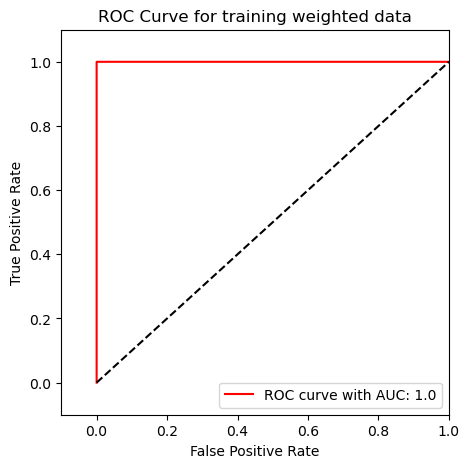

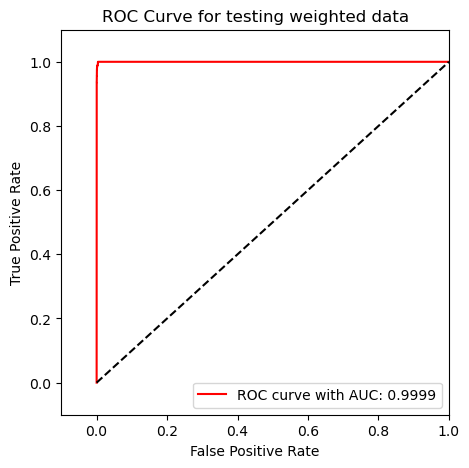

In [35]:
ypred_train = estimator.predict(Xtrain_t)
ypred_test = estimator.predict(Xtest_t)

train_accuracy = accuracy_score(ytrain.values, ypred_train)
test_accuracy = accuracy_score(ytest.values, ypred_test)
print(f"Train weighted accuracy: {round(train_accuracy,4)}\nTest weighted accuracy: {round(test_accuracy,4)}\n")

#Confusion matrix
CF_train = confusion_matrix(ytrain, ypred_train)
CF_test = confusion_matrix(ytest, ypred_test)
print(f"Confusion matrix for weighted Training set:\n{CF_train}\n\nConfusion matrix for weighted Test set:\n{CF_test}\n")

#ROC curve and AUC curve
FPR_train, TPR_train, thresholds_train = roc_curve(ytrain.values, estimator.predict_proba(Xtrain_t)[:,1])
FPR_test, TPR_test, thresholds_test = roc_curve(ytest.values, estimator.predict_proba(Xtest_t)[:,1])
train_auc = round(auc(FPR_train, TPR_train),4)
test_auc = round(auc(FPR_test, TPR_test),4)
print(f"Training AUC score: {train_auc}\nTest AUC score: {test_auc}\n")

# misclassification
train_error = 1 - estimator.score(Xtrain_t, ytrain)
test_error = 1 - estimator.score(Xtest_t, ytest)
print(f"Training misclassification: {round(train_error,4)}\nTest misclassification: {round(test_error,4)}\n")

ROC_with_AUC(FPR_train, TPR_train, train_auc, "training weighted")
ROC_with_AUC(FPR_test, TPR_test, test_auc, "testing weighted")

# Q1-f
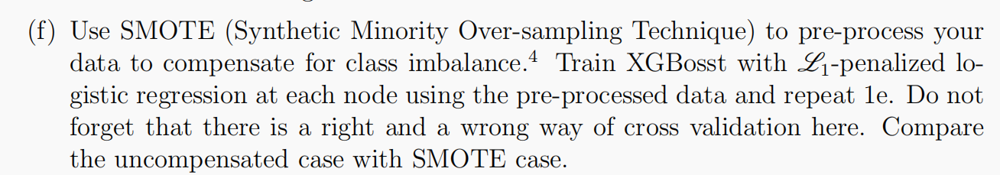

In [47]:
smote = SMOTE()
Xtrain_smote, ytrain_smote = smote.fit_resample(Xtrain, ytrain)

estimator = XGBClassifier(objective='binary:logistic', reg_alpha=best_alpha, learning_rate = 0.1, max_depth = 5, use_label_encoder=False, colsample_bytree = 0.3)
estimator.fit(Xtrain_smote, ytrain_smote)

cv = KFold(n_splits=5, shuffle=True, random_state=11)

grid_cv_smote = GridSearchCV(estimator, param_grid, n_jobs=5, cv=cv, scoring="accuracy")
grid_cv_smote.fit(Xtrain_smote, ytrain_smote)

print('The best alpha is ', grid_cv_smote.best_params_, ' with a cross validation accuracy of ', round(grid_cv_smote.best_score_, 4))

The best alpha is  {'reg_alpha': 0.2}  with a cross validation accuracy of  0.9998


In [48]:
df = pd.DataFrame(data={"before SMOTE": ytrain.value_counts(),"after SMOTE": ytrain_smote.value_counts()})
df

,before SMOTE,after SMOTE
class,,
0.0,59000,59000
1.0,1000,59000


In [52]:
best_alpha = grid_cv_smote.best_params_['reg_alpha']
estimator_smote = XGBClassifier(objective='binary:logistic',reg_alpha=best_alpha,colsample_bytree = 0.3, learning_rate = 0.1, max_depth = 5, use_label_encoder=False)       
estimator_smote.fit(Xtrain_smote, ytrain_smote)
ypred_train = estimator_smote.predict(Xtrain_smote)
ypred_train_prob = estimator_smote.predict_proba(Xtrain_smote)
ypred_test = estimator_smote.predict(Xtest)
ypred_test_prob = estimator_smote.predict_proba(Xtest)

Train weighted accuracy: 1.0
Test weighted accuracy: 0.2484

Confusion matrix for weighted Training set:
[[58998     2]
 [    0 59000]]

Confusion matrix for weighted Test set:
[[ 3606 12019]
 [    7   368]]

Training AUC score: 1.0
Test AUC score: 0.9148

Training misclassification: 0.0
Test misclassification: 0.7516



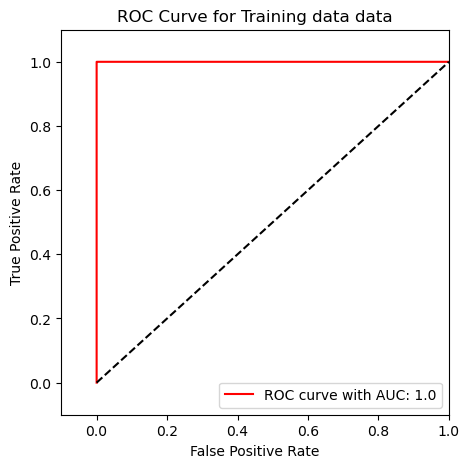

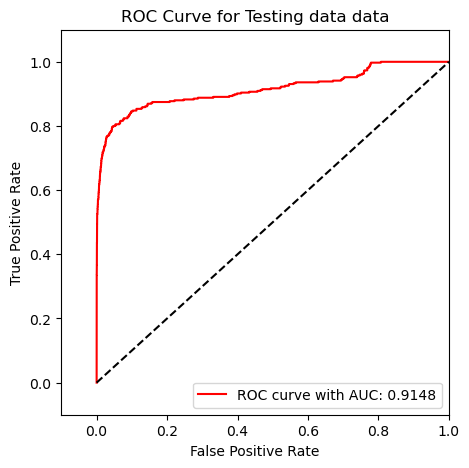

In [53]:
accuracy_train = accuracy_score(ytrain_smote.values, ypred_train)
accuracy_test = accuracy_score(ytest.values, ypred_test)
print(f"Train weighted accuracy: {round(accuracy_train,4)}\nTest weighted accuracy: {round(accuracy_test,4)}\n")

#Confusion matrix
CF_train = confusion_matrix(ytrain_smote, ypred_train)
CF_test = confusion_matrix(ytest, ypred_test)
print(f"Confusion matrix for weighted Training set:\n{CF_train}\n\nConfusion matrix for weighted Test set:\n{CF_test}\n")

#ROC curve and AUC curve
FPR_train, TPR_train, thresholds_train = roc_curve(ytrain_smote.values, estimator.predict_proba(Xtrain_smote)[:,1])
FPR_test, TPR_test, thresholds_test = roc_curve(ytest.values, estimator.predict_proba(Xtest)[:,1])
train_auc = round(auc(FPR_train, TPR_train),4)
test_auc = round(auc(FPR_test, TPR_test),4)
print(f"Training AUC score: {train_auc}\nTest AUC score: {test_auc}\n")

# misclassification
train_error = 1 - estimator.score(Xtrain_smote, ytrain_smote)
test_error = 1 - estimator.score(Xtest, ytest)
print(f"Training misclassification: {round(train_error,4)}\nTest misclassification: {round(test_error,4)}\n")

ROC_with_AUC(FPR_train, TPR_train, train_auc, "Training data")
ROC_with_AUC(FPR_test, TPR_test, test_auc, "Testing data")

# ISLR 6.6.3
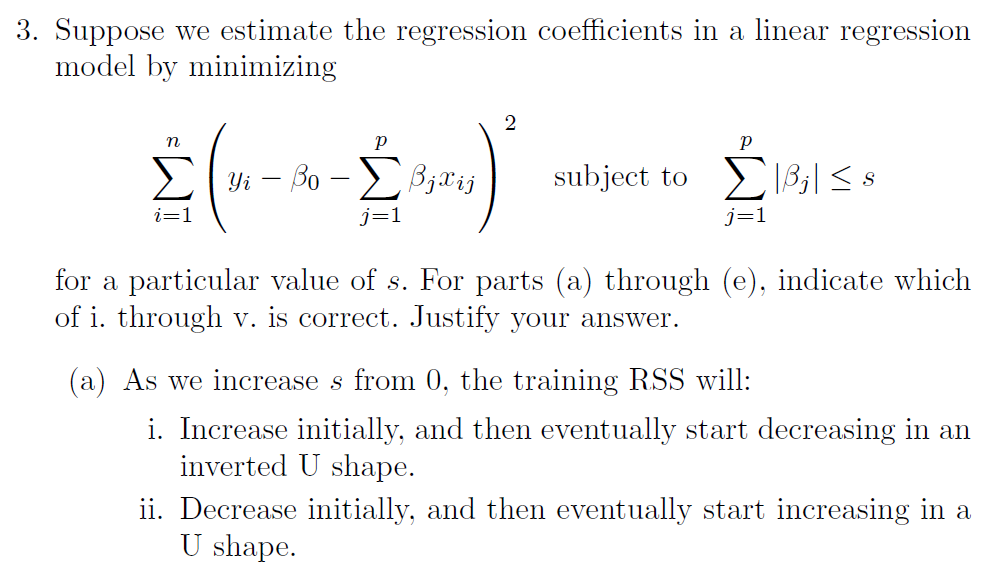
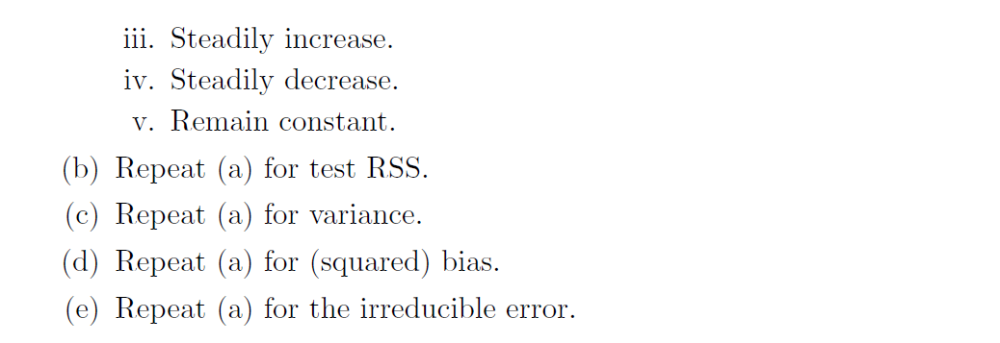

Solution:

    (a) iv is correct (As s increase, lambda decrease, and Flexibility increase which will decrease Train RSS)
    
    (b) ii is correct (As s increase, lambda decrease, and Flexibility increase which will initally drop Test RSS and then will increase owing to overfitting)
    
    (c) iii is correct (As s increase, lambda decrease, and Flexibility increase which will increase Variance)
    
    (d) iv is correct (As s increase, lambda decrease, and Flexibility increase which will decrease (squared) bias)
    
    (e) v is correct (s doesn't affect irreducible error it is independant of the model)

# ISLR 6.6.5
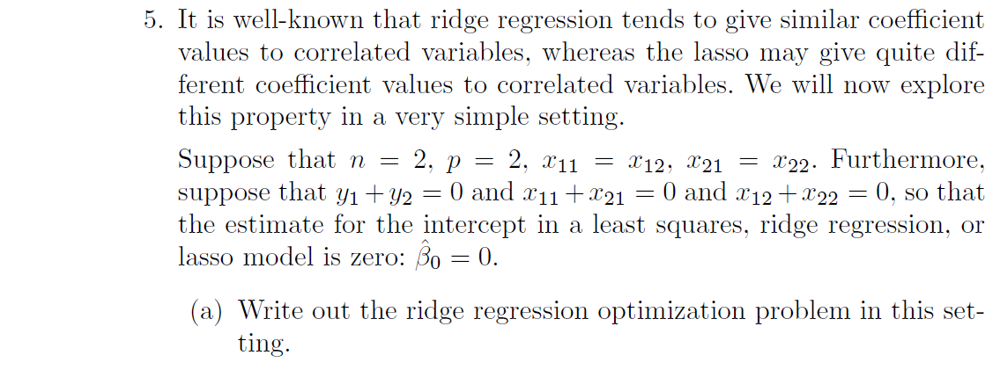
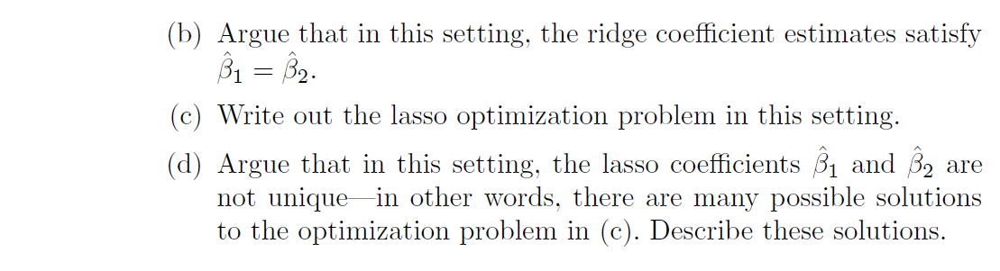

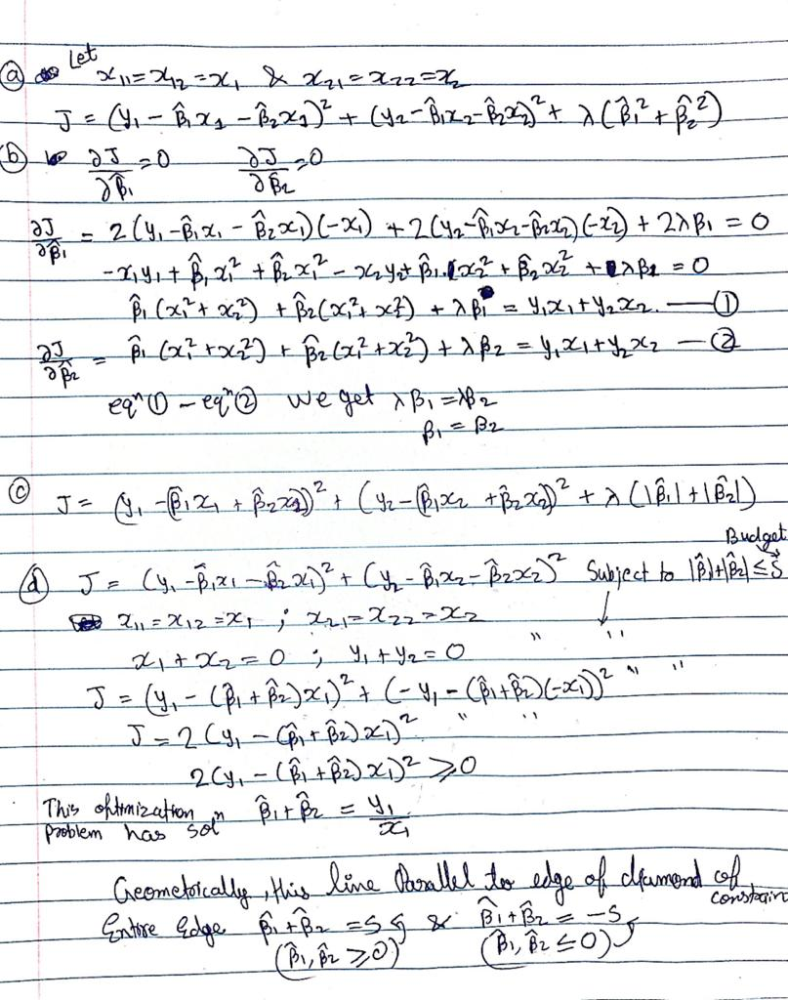

# ISLR 8.4.5
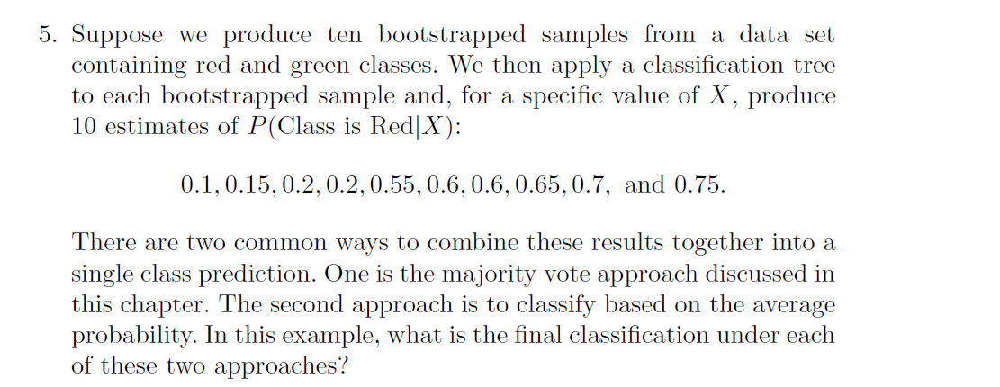

**Majority Vote**:
First 4 are Green and other 6 are Red

Using the Majority Vote method, we would categorize X as Red since it is the class that appears most frequently among the 10 predictions (there are 6 predictions for Red and 4 for Green).

**Average Probability**:
Avg = 0.45
Since Avg < 0.5
, It will classify to class Green

# ISLR 9.7.3
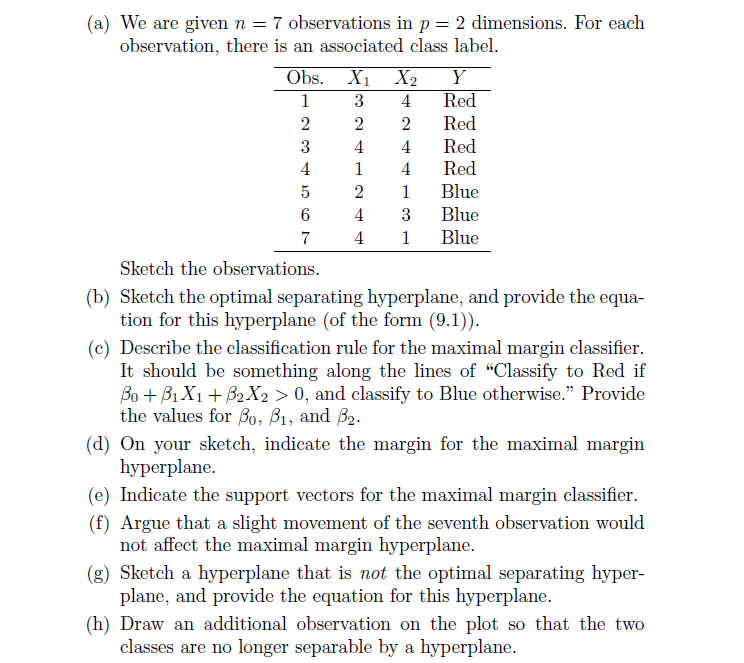

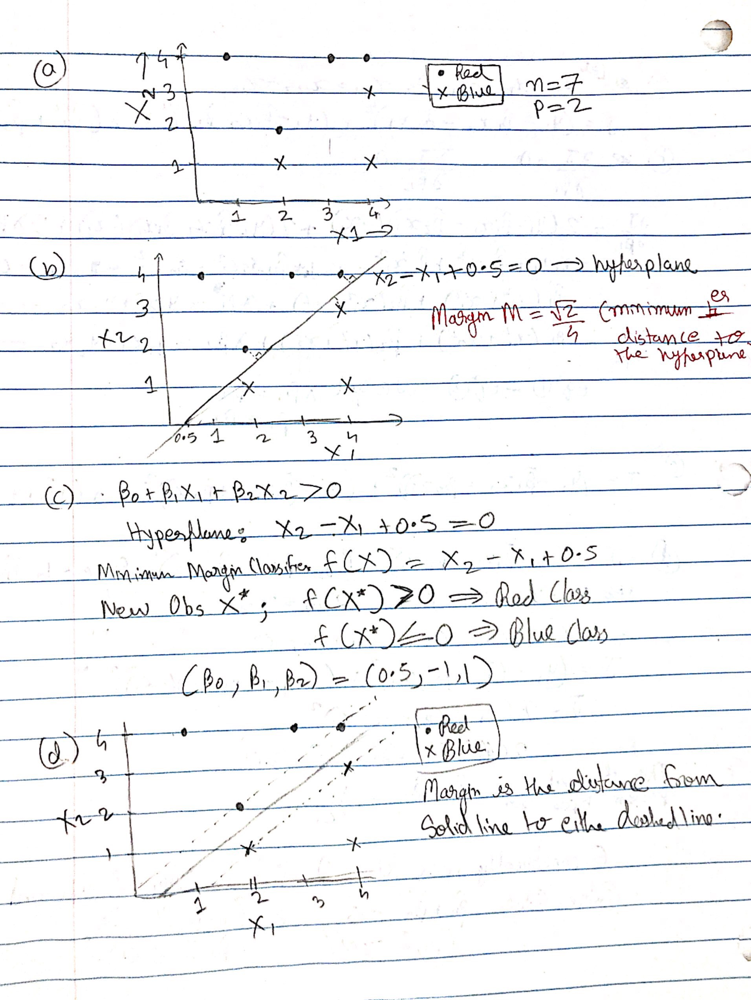

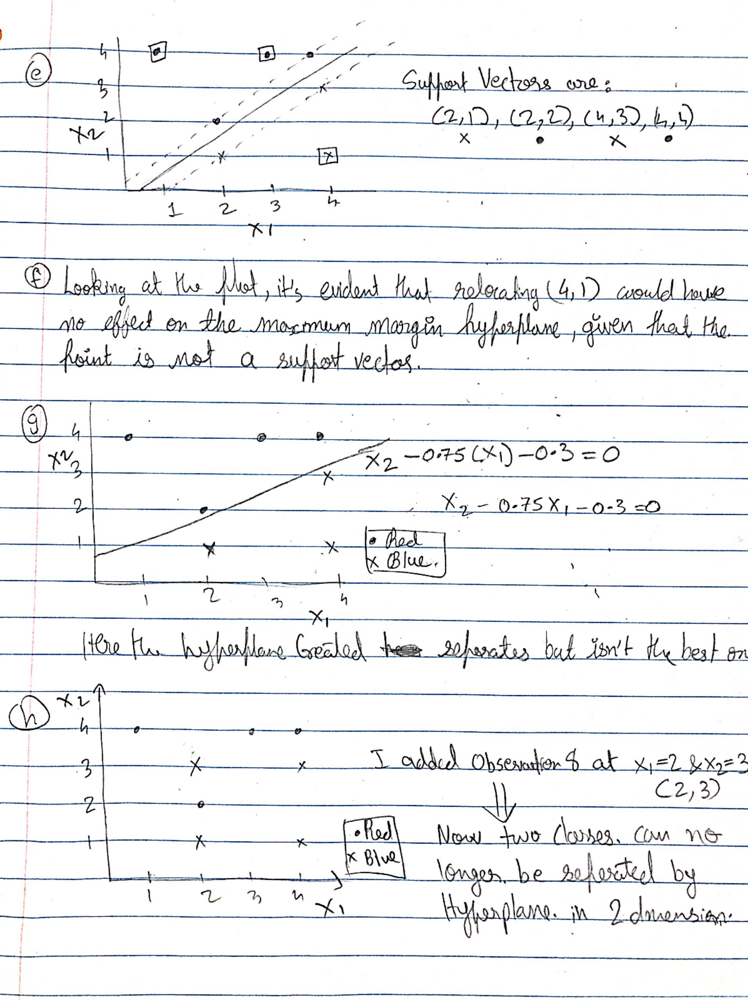